In [ ]:
#Import Libraries
import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) #adjusts the configuration of the plots we will create

In [ ]:
#To import external data
df = pd.read_csv('movies.csv')


In [ ]:
#to view the content of the data
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [ ]:
#to look for missing data

for col in df.columns:
   pct_missing = np.mean(df[col].isnull())
   print('{} - {}%'.format(col, pct_missing))

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [ ]:
#To fill the missimg values

numeric_columns = ['score', 'votes', 'budget', 'gross', 'runtime']
for col in numeric_columns:
    df[col].fillna(df[col].median(), inplace=True)

# Fill categorical columns (like 'rating', 'released', 'writer', 'star', 'company') with the mode
categorical_columns = ['rating', 'released', 'writer', 'star', 'country', 'company']
for col in categorical_columns:
    df[col].fillna(df[col].mode()[0], inplace=True)

<ipython-input-5-b10ee5b75657>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].median(), inplace=True)
<ipython-input-5-b10ee5b75657>:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using '

In [ ]:
# to check for missing values again
df.isna().sum()

,0
name,0
rating,0
genre,0
year,0
released,0
score,0
votes,0
director,0
writer,0
star,0


In [ ]:
#data types for coloumns

df.dtypes

,0
name,object
rating,object
genre,object
year,int64
released,object
score,float64
votes,float64
director,object
writer,object
star,object


In [22]:
#change data types of coloums

df['budget'] = df['budget'].astype('int64')

df['gross'] = df['gross'].astype('int64')

In [42]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,6587,6,6,1980,1705,8.4,927000.0,2589,4014,1047,54,19000000,46998772,2319,146.0,14
1,5573,6,1,1980,1492,5.8,65000.0,2269,1632,327,55,4500000,58853106,731,104.0,13
2,5142,4,0,1980,1771,8.7,1200000.0,1111,2567,1745,55,18000000,538375067,1540,124.0,14
3,286,4,4,1980,1492,7.7,221000.0,1301,2000,2246,55,3500000,83453539,1812,88.0,13
4,1027,6,4,1980,1543,7.3,108000.0,1054,521,410,55,6000000,39846344,1777,98.0,13


In [43]:
# Create correct year coloum

df['yearcorrect'] = df['released'].astype(str).str[:4]

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,6587,6,6,1980,1705,8.4,927000.0,2589,4014,1047,54,19000000,46998772,2319,146.0,1705
1,5573,6,1,1980,1492,5.8,65000.0,2269,1632,327,55,4500000,58853106,731,104.0,1492
2,5142,4,0,1980,1771,8.7,1200000.0,1111,2567,1745,55,18000000,538375067,1540,124.0,1771
3,286,4,4,1980,1492,7.7,221000.0,1301,2000,2246,55,3500000,83453539,1812,88.0,1492
4,1027,6,4,1980,1543,7.3,108000.0,1054,521,410,55,6000000,39846344,1777,98.0,1543


In [24]:
# TO arrange the gross data from top to bottom in an assending format

df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,Dece
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,Apri
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,Dece
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,Dece
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,Apri
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,July
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0,June
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0,May
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0,Apri
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0,Nove


In [25]:
#to show the full dataset here on colab to know what i am working with in full

pd.set_option('display.max_rows', None)

In [26]:
#Drop any duplicate

df['company'].drop_duplicates().sort_values(ascending=False)

,company
7129,thefyzz
5664,micro_scope
6412,iDeal Partners Film Fund
4007,i5 Films
6793,i am OTHER
6420,erbp
3776,double A Films
524,Zupnik-Curtis Enterprises
3330,Zucker Brothers Productions
146,Zoetrope Studios


In [41]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,6587,6,6,1980,1705,8.4,927000.0,2589,4014,1047,54,19000000,46998772,2319,146.0,14
1,5573,6,1,1980,1492,5.8,65000.0,2269,1632,327,55,4500000,58853106,731,104.0,13
2,5142,4,0,1980,1771,8.7,1200000.0,1111,2567,1745,55,18000000,538375067,1540,124.0,14
3,286,4,4,1980,1492,7.7,221000.0,1301,2000,2246,55,3500000,83453539,1812,88.0,13
4,1027,6,4,1980,1543,7.3,108000.0,1054,521,410,55,6000000,39846344,1777,98.0,13


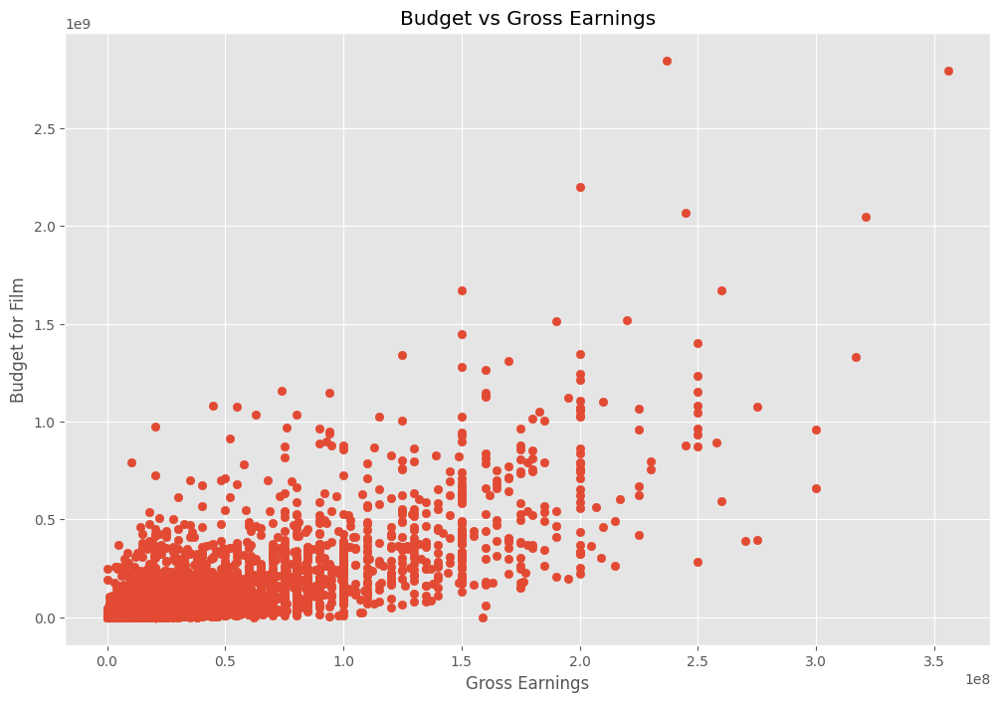

In [28]:
#Scatter plot with budget vs gross


plt.scatter(x=df['budget'], y=df['gross'])
plt.title('Budget vs Gross Earnings')
plt.xlabel('Gross Earnings')
plt.ylabel('Budget for Film')

plt.show()

In [29]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,June
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,July
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,June
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,July
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,July


<Axes: xlabel='budget', ylabel='gross'>

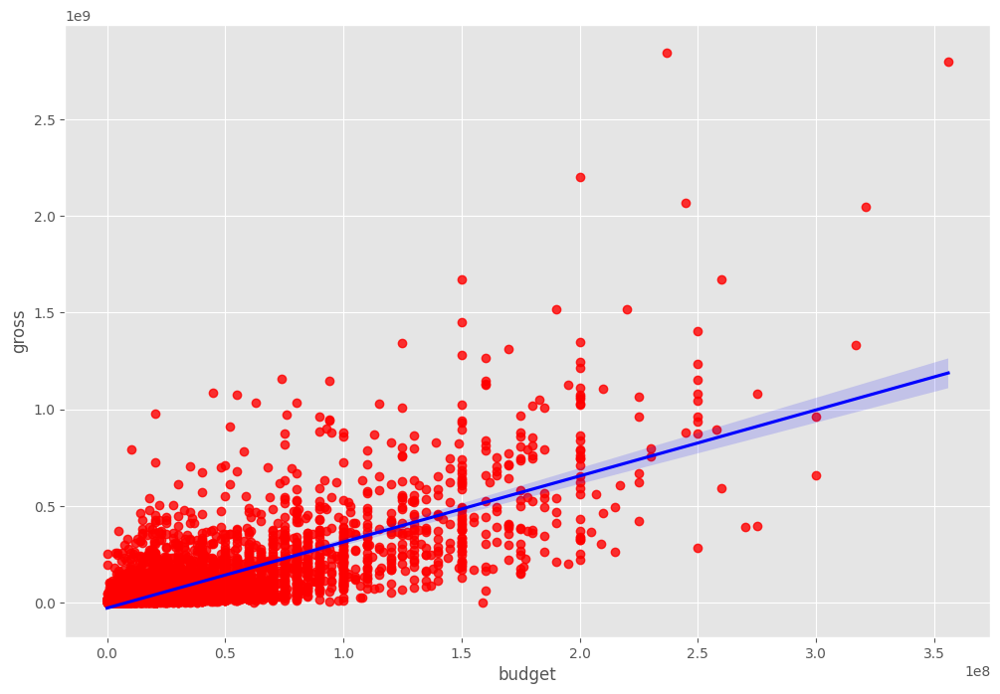

In [30]:
# plot budget versus gross using seaborn

sns.regplot(x='budget', y='gross', data=df, scatter_kws={'color':'red'}, line_kws={'color':'blue'})

In [32]:
# to look at correlation which works on only numerical fields or columns

# Select only numeric columns from the DataFrame
numeric_df = df.select_dtypes(include=['number'])

# Compute the correlation on the numeric-only DataFrame
correlation_matrix = numeric_df.corr(method='pearson')
print(correlation_matrix)

             year     score     votes    budget     gross   runtime
year     1.000000  0.098013  0.222573  0.291690  0.259504  0.120662
score    0.098013  1.000000  0.409157  0.061931  0.185563  0.399407
votes    0.222573  0.409157  1.000000  0.460968  0.632120  0.309151
budget   0.291690  0.061931  0.460968  1.000000  0.745881  0.273371
gross    0.259504  0.185563  0.632120  0.745881  1.000000  0.244380
runtime  0.120662  0.399407  0.309151  0.273371  0.244380  1.000000


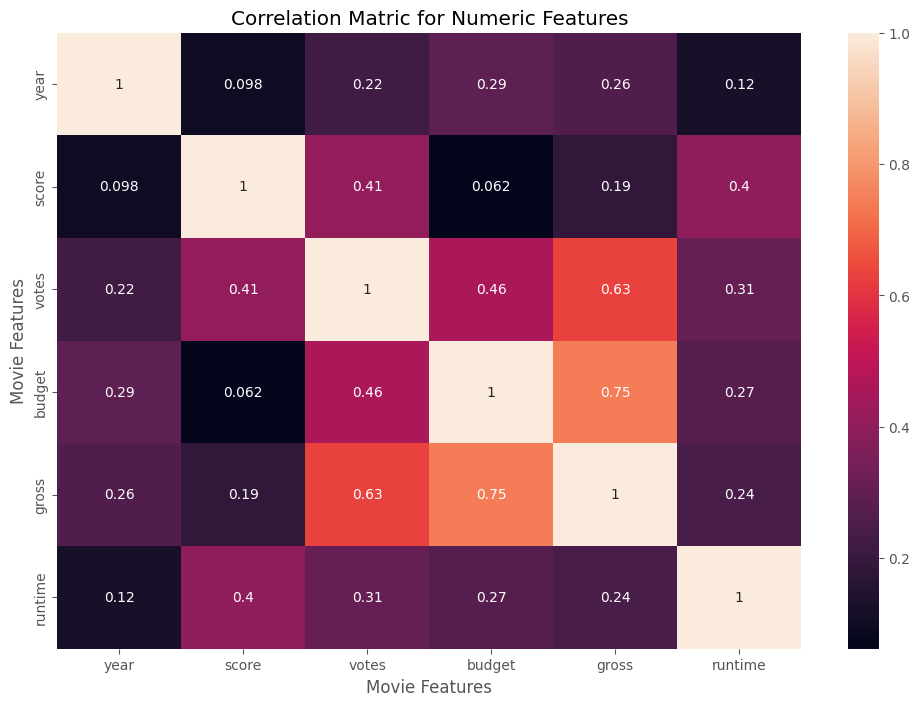

In [33]:
# high correlation between budget and gross
# I was right
correlation_matrix = numeric_df.corr(method='pearson')
sns.heatmap(correlation_matrix, annot =True)
plt.title('Correlation Matric for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

In [34]:
# look at company
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,June
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,July
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,June
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,July
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,July


In [35]:
# to convert company column and other non numericcal columns to numerical columms
df_numerized = df

for col_name in df_numerized.columns:
  if(df_numerized[col_name].dtype == 'object'):
    df_numerized[col_name] = df_numerized[col_name].astype('category')
    df_numerized[col_name] = df_numerized[col_name].cat.codes

df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,6587,6,6,1980,1705,8.4,927000.0,2589,4014,1047,54,19000000,46998772,2319,146.0,14
1,5573,6,1,1980,1492,5.8,65000.0,2269,1632,327,55,4500000,58853106,731,104.0,13
2,5142,4,0,1980,1771,8.7,1200000.0,1111,2567,1745,55,18000000,538375067,1540,124.0,14
3,286,4,4,1980,1492,7.7,221000.0,1301,2000,2246,55,3500000,83453539,1812,88.0,13
4,1027,6,4,1980,1543,7.3,108000.0,1054,521,410,55,6000000,39846344,1777,98.0,13
5,2109,6,10,1980,2502,6.4,123000.0,2528,4362,241,55,550000,39754601,1812,95.0,16
6,5574,6,0,1980,1771,7.9,188000.0,1412,838,1277,55,27000000,115229890,2281,133.0,14
7,4436,6,3,1980,699,8.2,330000.0,1829,1769,2240,55,18000000,23402427,631,129.0,10
8,5281,4,0,1980,1753,6.8,101000.0,2306,1979,877,55,54000000,108185706,883,127.0,14
9,6213,6,3,1980,2286,7.0,10000.0,2864,423,589,55,10000000,15795189,2272,100.0,16


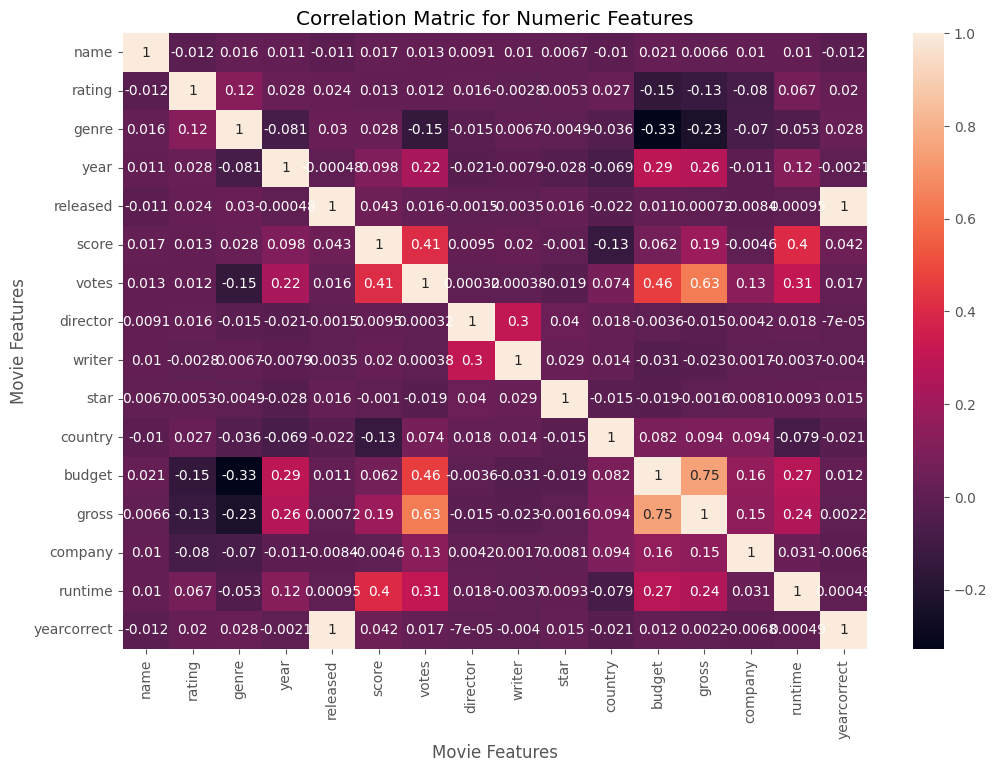

In [36]:
correlation_matrix = df_numerized.corr(method='pearson')
sns.heatmap(correlation_matrix, annot =True)
plt.title('Correlation Matric for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

In [37]:

df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
name,1.000000,-0.012441,0.016355,0.011453,-0.011087,0.017105,0.013056,0.009079,0.010018,0.006749,-0.010425,0.020921,0.006601,0.010369,0.010335,-0.012343
rating,-0.012441,1.000000,0.123465,0.027931,0.023643,0.013276,0.012286,0.016255,-0.002795,0.005314,0.026930,-0.148543,-0.130478,-0.079626,0.066597,0.020036
genre,0.016355,0.123465,1.000000,-0.081261,0.029997,0.027965,-0.145291,-0.015258,0.006746,-0.004856,-0.035896,-0.328484,-0.233385,-0.070013,-0.052719,0.027960
year,0.011453,0.027931,-0.081261,1.000000,-0.000484,0.098013,0.222573,-0.020795,-0.007901,-0.027745,-0.069423,0.291690,0.259504,-0.011438,0.120662,-0.002132
released,-0.011087,0.023643,0.029997,-0.000484,1.000000,0.042662,0.015980,-0.001492,-0.003461,0.015550,-0.022042,0.011049,0.000721,-0.008443,0.000947,0.995317
score,0.017105,0.013276,0.027965,0.098013,0.042662,1.000000,0.409157,0.009540,0.019745,-0.001006,-0.134557,0.061931,0.185563,-0.004570,0.399407,0.041517
votes,0.013056,0.012286,-0.145291,0.222573,0.015980,0.409157,1.000000,0.000316,0.000379,-0.019371,0.073522,0.460968,0.632120,0.130562,0.309151,0.017156
director,0.009079,0.016255,-0.015258,-0.020795,-0.001492,0.009540,0.000316,1.000000,0.299512,0.039715,0.017926,-0.003584,-0.014758,0.004250,0.017611,-0.000070
writer,0.010018,-0.002795,0.006746,-0.007901,-0.003461,0.019745,0.000379,0.299512,1.000000,0.028745,0.014409,-0.031050,-0.023028,0.001665,-0.003715,-0.003956
star,0.006749,0.005314,-0.004856,-0.027745,0.015550,-0.001006,-0.019371,0.039715,0.028745,1.000000,-0.014749,-0.018814,-0.001640,0.008072,0.009253,0.015164


In [38]:
# for better visualization by unstacking
correlation_mat = df_numerized.corr()
corr_pairs = correlation_mat.unstack()
corr_pairs

name         name           1.000000
             rating        -0.012441
             genre          0.016355
             year           0.011453
             released      -0.011087
             score          0.017105
             votes          0.013056
             director       0.009079
             writer         0.010018
             star           0.006749
             country       -0.010425
             budget         0.020921
             gross          0.006601
             company        0.010369
             runtime        0.010335
             yearcorrect   -0.012343
rating       name          -0.012441
             rating         1.000000
             genre          0.123465
             year           0.027931
             released       0.023643
             score          0.013276
             votes          0.012286
             director       0.016255
             writer        -0.002795
             star           0.005314
             country        0.026930
             budget        -0.148543
             gross         -0.130478
             company       -0.079626
             runtime        0.066597
             yearcorrect    0.020036
genre        name           0.016355
             rating         0.123465
             genre          1.000000
             year          -0.081261
             released       0.029997
             score          0.027965
             votes         -0.145291
             director      -0.015258
             writer         0.006746
             star          -0.004856
             country       -0.035896
             budget        -0.328484
             gross         -0.233385
             company       -0.070013
             runtime       -0.052719
             yearcorrect    0.027960
year         name           0.011453
             rating         0.027931
             genre         -0.081261
             year           1.000000
             released      -0.000484
             score          0.098013
             votes          0.222573
             director      -0.020795
             writer        -0.007901
             star          -0.027745
             country       -0.069423
             budget         0.291690
             gross          0.259504
             company       -0.011438
             runtime        0.120662
             yearcorrect   -0.002132
released     name          -0.011087
             rating         0.023643
             genre          0.029997
             year          -0.000484
             released       1.000000
             score          0.042662
             votes          0.015980
             director      -0.001492
             writer        -0.003461
             star           0.015550
             country       -0.022042
             budget         0.011049
             gross          0.000721
             company       -0.008443
             runtime        0.000947
             yearcorrect    0.995317
score        name           0.017105
             rating         0.013276
             genre          0.027965
             year           0.098013
             released       0.042662
             score          1.000000
             votes          0.409157
             director       0.009540
             writer         0.019745
             star          -0.001006
             country       -0.134557
             budget         0.061931
             gross          0.185563
             company       -0.004570
             runtime        0.399407
             yearcorrect    0.041517
votes        name           0.013056
             rating         0.012286
             genre         -0.145291
             year           0.222573
             released       0.015980
             score          0.409157
             votes          1.000000
             director       0.000316
             writer         0.000379
             star          -0.019371
             country        0.073522
             budget         0.460968
    

In [39]:
#for a better visualisation also
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

budget       genre         -0.328484
genre        budget        -0.328484
             gross         -0.233385
gross        genre         -0.233385
budget       rating        -0.148543
rating       budget        -0.148543
genre        votes         -0.145291
votes        genre         -0.145291
country      score         -0.134557
score        country       -0.134557
rating       gross         -0.130478
gross        rating        -0.130478
genre        year          -0.081261
year         genre         -0.081261
rating       company       -0.079626
company      rating        -0.079626
country      runtime       -0.079305
runtime      country       -0.079305
genre        company       -0.070013
company      genre         -0.070013
country      year          -0.069423
year         country       -0.069423
runtime      genre         -0.052719
genre        runtime       -0.052719
country      genre         -0.035896
genre        country       -0.035896
writer       budget        -0.031050
budget       writer        -0.031050
star         year          -0.027745
year         star          -0.027745
gross        writer        -0.023028
writer       gross         -0.023028
released     country       -0.022042
country      released      -0.022042
year         director      -0.020795
director     year          -0.020795
country      yearcorrect   -0.020769
yearcorrect  country       -0.020769
star         votes         -0.019371
votes        star          -0.019371
budget       star          -0.018814
star         budget        -0.018814
director     genre         -0.015258
genre        director      -0.015258
director     gross         -0.014758
gross        director      -0.014758
country      star          -0.014749
star         country       -0.014749
name         rating        -0.012441
rating       name          -0.012441
yearcorrect  name          -0.012343
name         yearcorrect   -0.012343
company      year          -0.011438
year         company       -0.011438
name         released      -0.011087
released     name          -0.011087
name         country       -0.010425
country      name          -0.010425
released     company       -0.008443
company      released      -0.008443
year         writer        -0.007901
writer       year          -0.007901
yearcorrect  company       -0.006845
company      yearcorrect   -0.006845
genre        star          -0.004856
star         genre         -0.004856
company      score         -0.004570
score        company       -0.004570
writer       yearcorrect   -0.003956
yearcorrect  writer        -0.003956
writer       runtime       -0.003715
runtime      writer        -0.003715
director     budget        -0.003584
budget       director      -0.003584
writer       released      -0.003461
released     writer        -0.003461
writer       rating        -0.002795
rating       writer        -0.002795
year         yearcorrect   -0.002132
yearcorrect  year          -0.002132
gross        star          -0.001640
star         gross         -0.001640
released     director      -0.001492
director     released      -0.001492
score        star          -0.001006
star         score         -0.001006
year         released      -0.000484
released     year          -0.000484
director     yearcorrect   -0.000070
yearcorrect  director      -0.000070
director     votes          0.000316
votes        director       0.000316
             writer         0.000379
writer       votes          0.000379
yearcorrect  runtime        0.000488
runtime      yearcorrect    0.000488
released     gross          0.000721
gross        released       0.000721
released     runtime        0.000947
runtime      released       0.000947
writer       company        0.001665
company      writer         0.001665
yearcorrect  gross          0.002170
gross        yearcorrect    0.002170
company      director       0.004250
director     company        0.004250
star         rating         0.005314
rating       star           0.005314
gros

In [40]:
# to sort
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr

,,0
gross,votes,0.632120
votes,gross,0.632120
gross,budget,0.745881
budget,gross,0.745881
yearcorrect,released,0.995317
released,yearcorrect,0.995317
name,name,1.000000
company,company,1.000000
gross,gross,1.000000
budget,budget,1.000000


In [ ]:
# votes and budget have the highest correlation to gross earnings
#Company has low correlation